Classification model

Deliverable I

In [1]:
#Importing libraries 

from google.colab import files
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import pandas as pd
import io
import numpy as np; np.random.seed(42)
import plotly.express as px

import statsmodels.api as sm1
import statsmodels.regression.linear_model as sm2
import statsmodels as sm3
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as sm4
import statsmodels.api as sm
import seaborn as sns
from sklearn import preprocessing
import seaborn as sns 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from google.colab import drive
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import KFold  #instead of splitting data into testing or training just in kfolds.
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import classification_report
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [2]:
#we loaded the data from google drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
!ls "/content/gdrive/My Drive/Colab Notebooks/testing_data_2_predictor_values.csv"

'/content/gdrive/My Drive/Colab Notebooks/testing_data_2_predictor_values.csv'


In [4]:
#reading the training data set 
data=pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/training_data_2.csv')
data

,Activity,Node1,Node2,Node3,Node4,Node5,Node6,Node7,Node8,Node9,Node10,Node11,Node12,Node13,Node14,Node15,Node16,Node17,Node18,Node19,Node20,Node21,Node22,Node23,Node24,Node25,Node26,Node27,Node28,Node29,Node30,Node31,Node32,Node33,Node34,Node35,Node36,Node37,Node38,Node39,...,Node162,Node163,Node164,Node165,Node166,Node167,Node168,Node169,Node170,Node171,Node172,Node173,Node174,Node175,Node176,Node177,Node178,Node179,Node180,Node181,Node182,Node183,Node184,Node185,Node186,Node187,Node188,Node189,Node190,Node191,Node192,Node193,Node194,Node195,Node196,Node197,Node198,Node199,Node200,Response
0,Activity1,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,...,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,0
1,Activity2,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,...,5.5378,5.0988,22.0330,5.5134,30.2645,10.4968,-7.2352,16.5721,-7.3477,11.0752,-5.5937,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,9.4878,-14.9100,9.4245,22.5441,-4.8622,7.6543,-15.9319,13.3175,-0.3566,7.6421,0
2,Activity3,5.9525,-0.3249,-11.2648,14.1929,7.3124,7.5244,14.6472,7.6782,-1.7395,4.7011,20.4775,17.7559,18.1377,1.2145,3.5137,5.6777,13.2177,-7.9940,-2.9029,5.8463,6.1439,-11.1025,12.4858,-2.2871,19.0422,NaN,4.1087,4.6974,6.9346,10.8917,0.9003,-13.5174,2.2439,11.5283,12.0406,4.1006,-7.9078,11.1405,-5.7864,...,-7.0927,-3.9116,7.2569,-5.8234,25.6820,10.9202,-0.3104,8.8438,-9.7009,2.4013,-4.2935,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,9.3908,-13.2648,3.1545,23.0866,-5.3000,5.3745,-6.2660,10.1934,-0.8417,2.9057,0
3,Activity4,8.2450,2.3061,2.8102,13.8463,11.9704,6.4569,14.8372,10.7430,-0.4299,15.9426,13.7257,20.3010,12.5579,6.8202,2.7229,12.1354,13.7367,0.8135,-0.9059,5.9070,2.8407,-15.2398,10.4407,-2.5731,6.1796,10.6093,-5.9158,8.1723,2.8521,9.1738,0.6665,-3.8294,-1.0370,11.7770,11.2834,8.0485,-24.6840,12.7404,-35.1659,...,-7.1541,-6.1920,18.2366,11.7134,14.7483,8.1013,11.8771,13.9552,-10.4701,5.6961,-3.7546,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.4117,1.8986,7.2601,-0.4639,-0.0498,7.9336,-12.8279,12.4124,1.8489,4.4666,0
4,Activity5,7.6784,-9.4458,-12.1419,13.8481,7.8895,7.7894,15.0553,8.4871,-3.0680,6.5263,11.3152,21.4246,18.9608,10.1102,2.7142,14.2080,13.5433,3.1736,-3.3423,5.9015,7.9352,-3.1582,9.4668,-0.0083,19.3239,12.4057,0.6329,2.7922,5.8184,19.3038,1.4450,-5.5963,14.0685,11.9171,11.5111,6.9087,-65.4863,13.8657,0.0444,...,1.4493,-2.6627,19.8056,2.3705,18.4685,16.3309,-3.3456,13.5261,1.7189,5.1743,-7.6938,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,9.7685,4.8910,12.2198,11.8503,-7.8931,6.4209,5.9270,16.0201,-0.2829,-1.4905,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179994,Activit

In [5]:
#we can see the detailes of each predictor column
data.describe()

,Node1,Node2,Node3,Node4,Node5,Node6,Node7,Node8,Node9,Node10,Node11,Node12,Node13,Node14,Node15,Node16,Node17,Node18,Node19,Node20,Node21,Node22,Node23,Node24,Node25,Node26,Node27,Node28,Node29,Node30,Node31,Node32,Node33,Node34,Node35,Node36,Node37,Node38,Node39,Node40,...,Node162,Node163,Node164,Node165,Node166,Node167,Node168,Node169,Node170,Node171,Node172,Node173,Node174,Node175,Node176,Node177,Node178,Node179,Node180,Node181,Node182,Node183,Node184,Node185,Node186,Node187,Node188,Node189,Node190,Node191,Node192,Node193,Node194,Node195,Node196,Node197,Node198,Node199,Node200,Response
count,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.00000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179996.000000,179997.000000,179995.000000,179996.000000,179995.000000,179996.000000,179998.000000,179996.000000,179996.000000,179996.000000,179995.000000,179996.000000,179997.000000,179994.000000,179996.000000,179995.000000,179999.000000,179997.000000,179999.000000,179999.000000,...,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179999.000000,179997.000000,179998.000000,179999.000000,179998.000000,179999.000000,179997.000000,179999.000000,179999.000000,179999.000000,179996.000000,179998.000000,179998.000000,179999.000000,179998.000000,179999.000000,179998.000000,179999.000000,179998.000000,179999.000000
mean,7.566954,0.389317,-3.246989,14.024019,8.528055,7.537824,14.572826,9.333641,-5.701505,15.243488,12.439018,13.292053,17.264925,4.306139,3.02009,10.582009,13.667783,-4.046509,-1.138403,5.532217,5.053764,-7.681063,10.390301,-0.513853,14.777229,11.434941,3.842668,2.186758,5.867123,10.641165,0.661265,-6.727667,9.298029,11.222424,11.570039,8.942285,-12.675955,11.329235,-12.462156,14.715898,...,-0.000404,-0.828662,19.833778,-0.668317,20.208878,11.639970,-2.796299,11.883081,-1.011800,2.595098,-2.740739,7.440690,1.927073,3.335052,17.995081,-0.143146,2.296006,8.909452,15.870167,-3.329528,10.678645,-1.630052,10.712899,6.795323,11.080131,-5.072469,5.408707,16.550301,0.283383,10.085554,0.723730,8.771636,12.756526,-3.987623,8.967258,-10.329686,15.379811,0.746813,3.236215,0.100223
std,1.235046,5.498567,5.974869,0.190037,4.641701,2.248604,0.412079,2.557967,6.713204,7.851026,8.001270,5.880710,8.203202,2.845767,0.52693,3.775528,0.285278,5.921870,1.523991,0.783691,2.617485,7.963136,2.160116,2.588042,4.324634,0.541385,5.182528,3.120035,2.249336,4.282065,4.069269,8.278492,5.939505,0.696657,0.309717,5.905754,21.410778,2.860641,10.577682,11.386969,...,4.422924,5.377375,8.675046,5.968312,7.132452,2.890321,7.520833,2.630687,8.580815,2.801698,5.258839,3.021626,1.476779,3.991299,3.135173,1.428453,5.455526,0.922088,3.010501,10.440824,3.041044,4.050529,2.639150,2.043239,1.622642,7.856651,0.866259,3.417075,3.334473,1.372142,8.960314,4.474504,9.320928,4.723607,3.189851,11.567969,3.944047,0.976404,4.561336,0.300298
min,3.970500,-20.731300,-26.095000,13.434600,-6.011100,1.013300,13.076900,0.635100,-33.380200,-10.664200,-11.557600,-5.432200,-10.089000,-5.322500,1.20980,-0.678400,12.720000,-24.243100,-6.166800,2.089600,-4.787200,-34.798400,2.140600,-8.986100,1.508500,9.816900,-16.513600,-8.095100,-1.183400,-6.337100,-14.545700,-35.211700,-8.535900,8.964800,10.652800,-9.939600,-90.252500,1.835000,-47.686200,-23.902200,...,-14.506000,-22.479300,-11.453300,-22.748700,-2.995300,3.241500,-29.116500,4.952100,-29.273400,-7.856100,-22.037400,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800,0.408400,-15.043400,2.117100,-0.040200,5.277800,-32.562600,2.347300,5.349700,-10.505500,5.416500,-26.001100,-4.808200,-18.489700,-22.583300,-3.02

In [6]:
#count how many 0 and 1 we have
# 0 is not malicious and 1 is malicious
data['Response'].value_counts()

0    161959
1     18040
Name: Response, dtype: int64

Data Visualization

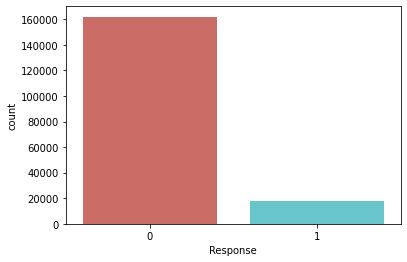

In [7]:
#plotting response values, malicious vs not malicious
sns.countplot(x=data['Response'], palette='hls') 

(array([161959.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,  18040.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

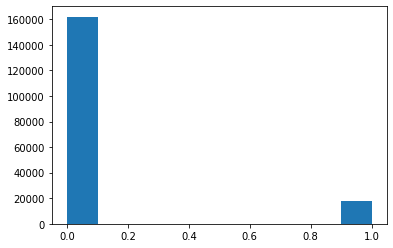

In [8]:
plt.hist(data['Response'],bins=10)

In [9]:
#Correlation between predictor variables
data.corr().style.background_gradient(cmap='coolwarm')
#HPositive numbers mean positive correlation, negative numbers means negative correlation, smaller numbers mean less correlation. 

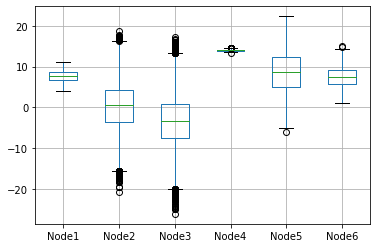

In [10]:
#box plots to visualize outliers 
np.random.seed(42)
boxplots=pd.DataFrame(data = data, columns = ['Node1','Node2','Node3','Node4','Node5','Node6'])
boxplots.boxplot()

#we need to standardize 

In [11]:
#dropping activity column from data set
X=data.drop('Activity',axis=1)

In [12]:
#plotting every predictor grouping it by response
X.groupby('Response').hist(figsize=(200, 200), color='blue')

Response
0    [[AxesSubplot(0.125,0.840677;0.0432961x0.03932...
1    [[AxesSubplot(0.125,0.840677;0.0432961x0.03932...
dtype: object

In [13]:
#check if we have NaN values data preprocessing
#MISSING VALUES
X.isnull()


,Node1,Node2,Node3,Node4,Node5,Node6,Node7,Node8,Node9,Node10,Node11,Node12,Node13,Node14,Node15,Node16,Node17,Node18,Node19,Node20,Node21,Node22,Node23,Node24,Node25,Node26,Node27,Node28,Node29,Node30,Node31,Node32,Node33,Node34,Node35,Node36,Node37,Node38,Node39,Node40,...,Node162,Node163,Node164,Node165,Node166,Node167,Node168,Node169,Node170,Node171,Node172,Node173,Node174,Node175,Node176,Node177,Node178,Node179,Node180,Node181,Node182,Node183,Node184,Node185,Node186,Node187,Node188,Node189,Node190,Node191,Node192,Node193,Node194,Node195,Node196,Node197,Node198,Node199,Node200,Response
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179994,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
179995,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fals

In [14]:
#sum how many nan values are present
X.isnull().any().sum()  

27

In [15]:
#finding nan in the data set
df1 = X[X.isna().any(axis=1)]
df1


,Node1,Node2,Node3,Node4,Node5,Node6,Node7,Node8,Node9,Node10,Node11,Node12,Node13,Node14,Node15,Node16,Node17,Node18,Node19,Node20,Node21,Node22,Node23,Node24,Node25,Node26,Node27,Node28,Node29,Node30,Node31,Node32,Node33,Node34,Node35,Node36,Node37,Node38,Node39,Node40,...,Node162,Node163,Node164,Node165,Node166,Node167,Node168,Node169,Node170,Node171,Node172,Node173,Node174,Node175,Node176,Node177,Node178,Node179,Node180,Node181,Node182,Node183,Node184,Node185,Node186,Node187,Node188,Node189,Node190,Node191,Node192,Node193,Node194,Node195,Node196,Node197,Node198,Node199,Node200,Response
2,5.9525,-0.3249,-11.2648,14.1929,7.3124,7.5244,14.6472,7.6782,-1.7395,4.7011,20.4775,17.7559,18.1377,1.2145,3.5137,5.6777,13.2177,-7.9940,-2.9029,5.8463,6.1439,-11.1025,12.4858,-2.2871,19.0422,NaN,4.1087,4.6974,6.9346,10.8917,0.9003,-13.5174,2.2439,11.5283,12.0406,4.1006,-7.9078,11.1405,-5.7864,20.7477,...,-7.0927,-3.9116,7.2569,-5.8234,25.6820,10.9202,-0.3104,8.8438,-9.7009,2.4013,-4.2935,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,9.3908,-13.2648,3.1545,23.0866,-5.3000,5.3745,-6.2660,10.1934,-0.8417,2.9057,0
6,7.9232,-5.1288,-7.5271,14.1629,13.3058,7.8412,14.3363,7.5951,11.0922,21.1976,6.2946,15.8877,24.2595,8.1159,3.9769,7.6851,13.3600,-0.5156,0.0690,5.6452,4.6140,-12.3890,12.0880,-1.5290,9.2376,11.1510,6.6352,4.8462,7.0202,19.9479,-6.2271,4.4616,9.0383,10.6889,10.9480,15.0431,1.0776,NaN,-2.0894,26.6997,...,0.2619,-1.1405,25.1675,2.6965,17.0152,12.7942,-3.0403,8.1735,4.5637,3.8973,-8.1416,6.4521,3.5325,0.1777,18.3314,0.5845,9.1104,9.1143,10.8869,-3.2097,11.8091,-0.0832,9.3494,4.2916,11.1355,-8.0198,6.1961,12.0771,-4.3781,10.0570,15.7862,3.3593,11.9140,-4.2870,7.5015,-29.9763,17.2867,1.8539,8.7830,0
8,9.0827,0.9501,1.7982,14.0654,-3.0572,11.1642,14.8757,10.0075,-8.9472,3.8349,0.8560,10.6958,6.3738,6.5580,2.6182,13.2506,13.7929,-14.4918,-2.5407,5.9575,2.4882,-11.1344,10.5106,-1.0573,19.3290,12.2897,-2.8160,6.9208,5.1498,14.7272,3.7692,-5.1399,18.3702,11.6615,11.7713,NaN,16.4608,15.8764,-31.7855,36.3433,...,3.1838,-1.7865,4.9105,3.5803,32.9149,13.0201,-2.4845,11.0988,7.4609,-2.1408,-3.9172,14.7510,1.6395,1.4181,14.8370,-1.9940,-1.0733,8.1975,19.5114,4.8453,16.1071,2.4426,13.9307,5.6327,8.8014,6.1630,4.4514,10.1854,-3.1882,7.7291,-11.4027,2.0696,-1.7937,-0.0030,11.5024,-18.3172,13.1403,0.7014,1.4298,0
10,7.3198,4.6603,-14.0548,13.9059,9.0796,11.8218,14.3125,11.0386,4.7462,17.4442,10.7502,11.6244,8.2466,-0.5277,2.8072,7.4451,13.7830,-0.2494,-0.1141,5.9583,2.8036,-0.2332,12.5400,2.1982,11.5565,11.0755,5.4034,8.5073,6.9892,18.9346,2.3433,NaN,13.0761,9.9371,11.5166,16.2484,-14.3037,9.5389,1.3353,-4.7516,...,0.4344,6.5370,7.2105,-3.5162,27.1062,13.2255,1.1165,10.2981,-4.0424,3.9860,-11.6023,8.0819,0.2139,-0.0761,14.9585,-1.2160,6.6576,9.2553,14.2914,-7.6652,5.0702,-0.5447,9.5900,4.2987,12.3910,-18.8687,6.0382,14.3797,-0.4711,11.1783,14.8384,10.9622,22.4111,-3.3333,16.2396,-7.0216,17.3210,0.6963,7.2780,0
120,9.5272,-2.0212,-5.6058,13.6741,12.2757,10.7237,14.1523,11.4618,-15.5650,23.0837,9.4979,16.4714,26.7869,1.7332,2.6705,9.7859,13.2367,-2.0972,-0.5215,4.3271,4.4481,-0.4076,10.0734,2.4662,17.9280,10.9858,12.6772,1.9413,NaN,17.5786,1.9311,-5.8149,10.7177,12.1911,11.6889,-5.5787,-19.3989,11.2756,-7.8991,6.5358,...,-4.2770,-0.1054,23.3668,-7.0309,30.1773,15.5690,15.3851,9.6028,2.0225,1.2211,-5.9862,13.7319,0.8665,10.6605,24.4835,0.1339,-4.0743,7.8159,19.4458,-19.9356,7.6382,-6.3480,8.3145,7.6210,10.6435,-8.8025,7.1044,20.6761,2.5805,11.5528,-12.6491,15.9199,3.1174,-6.4631,9.8135,-30.3886,16.5201,2.4673,-1.6585,1
189,6.8277,-3.4849,-14.1675,14.0916,16.9114,12.4183,14.6806,5.4205,-4.9823,17.4915,8.1849,13.9125,9.9064,7.6753,3.2862,12.3375,13.6845,-6.8942,-1.0823,5.3805,4.1404,-13.3396,11.8191,2.0410,14.9076,12.2981,-2.6288,-2.0444,3.8666,13.6594,1.9816,-0.4158,13.8927,10.6746,NaN,8.1556,-6.2064,12.2015,-24.2229,34.0758,...,3.2379,-7.5896,18.6696,5.8159,14.6003,1

In [16]:
#DrOPPING NAN values from the data set
X=X.dropna()
X

,Node1,Node2,Node3,Node4,Node5,Node6,Node7,Node8,Node9,Node10,Node11,Node12,Node13,Node14,Node15,Node16,Node17,Node18,Node19,Node20,Node21,Node22,Node23,Node24,Node25,Node26,Node27,Node28,Node29,Node30,Node31,Node32,Node33,Node34,Node35,Node36,Node37,Node38,Node39,Node40,...,Node162,Node163,Node164,Node165,Node166,Node167,Node168,Node169,Node170,Node171,Node172,Node173,Node174,Node175,Node176,Node177,Node178,Node179,Node180,Node181,Node182,Node183,Node184,Node185,Node186,Node187,Node188,Node189,Node190,Node191,Node192,Node193,Node194,Node195,Node196,Node197,Node198,Node199,Node200,Response
0,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,...,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,0
1,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,...,5.5378,5.0988,22.0330,5.5134,30.2645,10.4968,-7.2352,16.5721,-7.3477,11.0752,-5.5937,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,9.4878,-14.9100,9.4245,22.5441,-4.8622,7.6543,-15.9319,13.3175,-0.3566,7.6421,0
3,8.2450,2.3061,2.8102,13.8463,11.9704,6.4569,14.8372,10.7430,-0.4299,15.9426,13.7257,20.3010,12.5579,6.8202,2.7229,12.1354,13.7367,0.8135,-0.9059,5.9070,2.8407,-15.2398,10.4407,-2.5731,6.1796,10.6093,-5.9158,8.1723,2.8521,9.1738,0.6665,-3.8294,-1.0370,11.7770,11.2834,8.0485,-24.6840,12.7404,-35.1659,0.7613,...,-7.1541,-6.1920,18.2366,11.7134,14.7483,8.1013,11.8771,13.9552,-10.4701,5.6961,-3.7546,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.4117,1.8986,7.2601,-0.4639,-0.0498,7.9336,-12.8279,12.4124,1.8489,4.4666,0
4,7.6784,-9.4458,-12.1419,13.8481,7.8895,7.7894,15.0553,8.4871,-3.0680,6.5263,11.3152,21.4246,18.9608,10.1102,2.7142,14.2080,13.5433,3.1736,-3.3423,5.9015,7.9352,-3.1582,9.4668,-0.0083,19.3239,12.4057,0.6329,2.7922,5.8184,19.3038,1.4450,-5.5963,14.0685,11.9171,11.5111,6.9087,-65.4863,13.8657,0.0444,-0.1346,...,1.4493,-2.6627,19.8056,2.3705,18.4685,16.3309,-3.3456,13.5261,1.7189,5.1743,-7.6938,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,9.7685,4.8910,12.2198,11.8503,-7.8931,6.4209,5.9270,16.0201,-0.2829,-1.4905,0
5,5.9790,0.8010,-0.6192,13.6380,1.2589,8.1939,14.9894,12.0763,-1.4710,6.7341,14.8241,19.7172,11.9882,1.0468,3.8663,4.7252,13.9427,-1.2796,-4.3763,5.1494,0.4124,-5.0732,4.9010,1.5459,15.6423,10.7209,15.1886,1.8685,7.7223,5.5317,2.2308,2.6553,13.9730,11.5015,11.6891,14.1062,-44.7257,10.6470,-24.6935,29.9912,...,-6.1449,-2.0285,18.4106,1.4457,21.8853,9.2654,-6.5247,10.7687,-7.6283,1.0208,7.1968,6.6025,5.2912,0.4403,14.9452,1.0314,-3.6241,9.7670,12.5809,-4.7602,11.4763,-2.3182,12.6080,8.6264,10.9621,3.5609,4.5322,15.2255,3.5855,11.1227,2.2257,6.4056,21.0550,-13.6509,4.7691,-8.9114,15.1007,2.4286,-6.3068,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179994,7.7214,2.9995,-12.0

In [17]:
#check if all nan are dropped
X.isnull().any().sum()

0

In [18]:
#Drop response and activity column and separate predictors from response

y=(X['Response'])
y
x=X.drop('Response',axis=1)
x
# x-----> predictors
# y-----> response

,Node1,Node2,Node3,Node4,Node5,Node6,Node7,Node8,Node9,Node10,Node11,Node12,Node13,Node14,Node15,Node16,Node17,Node18,Node19,Node20,Node21,Node22,Node23,Node24,Node25,Node26,Node27,Node28,Node29,Node30,Node31,Node32,Node33,Node34,Node35,Node36,Node37,Node38,Node39,Node40,...,Node161,Node162,Node163,Node164,Node165,Node166,Node167,Node168,Node169,Node170,Node171,Node172,Node173,Node174,Node175,Node176,Node177,Node178,Node179,Node180,Node181,Node182,Node183,Node184,Node185,Node186,Node187,Node188,Node189,Node190,Node191,Node192,Node193,Node194,Node195,Node196,Node197,Node198,Node199,Node200
0,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,...,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354
1,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,...,5.7999,5.5378,5.0988,22.0330,5.5134,30.2645,10.4968,-7.2352,16.5721,-7.3477,11.0752,-5.5937,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,9.4878,-14.9100,9.4245,22.5441,-4.8622,7.6543,-15.9319,13.3175,-0.3566,7.6421
3,8.2450,2.3061,2.8102,13.8463,11.9704,6.4569,14.8372,10.7430,-0.4299,15.9426,13.7257,20.3010,12.5579,6.8202,2.7229,12.1354,13.7367,0.8135,-0.9059,5.9070,2.8407,-15.2398,10.4407,-2.5731,6.1796,10.6093,-5.9158,8.1723,2.8521,9.1738,0.6665,-3.8294,-1.0370,11.7770,11.2834,8.0485,-24.6840,12.7404,-35.1659,0.7613,...,5.3430,-7.1541,-6.1920,18.2366,11.7134,14.7483,8.1013,11.8771,13.9552,-10.4701,5.6961,-3.7546,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.4117,1.8986,7.2601,-0.4639,-0.0498,7.9336,-12.8279,12.4124,1.8489,4.4666
4,7.6784,-9.4458,-12.1419,13.8481,7.8895,7.7894,15.0553,8.4871,-3.0680,6.5263,11.3152,21.4246,18.9608,10.1102,2.7142,14.2080,13.5433,3.1736,-3.3423,5.9015,7.9352,-3.1582,9.4668,-0.0083,19.3239,12.4057,0.6329,2.7922,5.8184,19.3038,1.4450,-5.5963,14.0685,11.9171,11.5111,6.9087,-65.4863,13.8657,0.0444,-0.1346,...,5.5518,1.4493,-2.6627,19.8056,2.3705,18.4685,16.3309,-3.3456,13.5261,1.7189,5.1743,-7.6938,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,9.7685,4.8910,12.2198,11.8503,-7.8931,6.4209,5.9270,16.0201,-0.2829,-1.4905
5,5.9790,0.8010,-0.6192,13.6380,1.2589,8.1939,14.9894,12.0763,-1.4710,6.7341,14.8241,19.7172,11.9882,1.0468,3.8663,4.7252,13.9427,-1.2796,-4.3763,5.1494,0.4124,-5.0732,4.9010,1.5459,15.6423,10.7209,15.1886,1.8685,7.7223,5.5317,2.2308,2.6553,13.9730,11.5015,11.6891,14.1062,-44.7257,10.6470,-24.6935,29.9912,...,5.9714,-6.1449,-2.0285,18.4106,1.4457,21.8853,9.2654,-6.5247,10.7687,-7.6283,1.0208,7.1968,6.6025,5.2912,0.4403,14.9452,1.0314,-3.6241,9.7670,12.5809,-4.7602,11.4763,-2.3182,12.6080,8.6264,10.9621,3.5609,4.5322,15.2255,3.5855,11.1227,2.2257,6.4056,21.0550,-13.6509,4.7691,-8.9114,15.1007,2.4286,-6.3068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17

In [19]:
##standarizing the values
#centering and scaling
x=StandardScaler().fit_transform(x)
x
x=pd.DataFrame(x)
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199
0,-1.473591,0.461156,1.075909,-0.054254,-1.713530,0.560828,-0.009125,-1.401509,-0.229024,-1.395990,2.283893,-0.468851,-0.127487,-0.606866,-1.040929,1.006778,-0.824709,-0.186067,0.479697,-0.767621,0.360190,0.925753,1.163731,-1.299295,0.488831,-0.448787,1.299710,-0.484059,0.898039,-1.395197,0.789641,0.179823,-0.323824,0.508541,1.532278,0.457099,0.264389,-1.890024,-0.165662,0.115193,...,-0.400380,-1.077086,-1.412722,0.120320,0.640337,-0.230890,-1.348481,-0.974369,0.699832,-0.292164,-0.312244,-1.077194,-1.150641,0.818939,-0.411885,0.168261,-1.578359,1.023300,-0.375212,-1.026450,0.214343,-0.576511,-1.273014,0.452806,-0.833138,0.234527,-0.536012,-0.334786,0.607601,-1.560560,-0.779142,0.261405,1.250945,1.403533,2.088165,0.901028,-0.811416,0.556455,-0.164993,0.262929
1,0.419582,-0.144184,1.892045,-0.000578,-0.024691,-0.935440,-2.117440,1.756767,-1.472255,-0.948132,2.016124,-1.677266,-1.770554,1.492162,0.667042,-0.954610,0.782521,-1.303945,-0.931912,-0.619867,-1.721377,-0.203188,-1.164110,0.695483,1.062274,-0.119620,-0.598628,0.196443,-0.010529,0.040902,0.741476,-0.529963,-1.250081,-1.930607,0.691458,-1.303470,-1.620784,-1.383424,1.196517,1.728723,...,0.443700,1.252161,1.102209,0.253544,1.035816,1.409814,-0.395485,-0.590195,1.782420,-0.738362,3.026670,-0.542588,0.092851,0.444657,1.908268,-0.818026,1.524117,1.068815,-0.130775,0.825720,0.505822,0.270257,-0.621479,1.191948,-0.688271,0.790128,1.542097,0.244846,-0.004871,0.858705,-0.435595,-1.744776,0.145821,1.049961,-0.185183,-0.411533,-0.484302,-0.522845,-1.130071,0.965965
2,0.549054,0.348560,1.013666,-0.935168,0.741610,-0.480742,0.641473,0.550932,0.785362,0.089049,0.160786,1.191841,-0.573801,0.883464,-0.564026,0.411438,0.241637,0.820809,0.152533,0.478207,-0.845487,-0.949240,0.023373,-0.795626,-1.988059,-1.525138,-1.882831,1.918548,-1.340371,-0.342615,0.001352,0.350058,-1.740013,0.796066,-0.925603,-0.151346,-0.560763,0.493288,-2.146504,-1.225558,...,-0.792390,-1.617351,-0.997404,-0.184088,2.074653,-0.765538,-1.224275,1.951057,0.787678,-1.102238,1.106803,-0.192871,-0.892788,-0.818910,-0.479431,1.607407,-0.789246,-0.957474,1.499495,0.697397,-0.543108,0.125507,-0.128816,-0.667216,0.195955,0.927195,0.411902,0.501126,-0.475697,-1.842739,-1.219835,0.131151,-0.337925,-1.418402,0.833596,-0.323972,-0.215971,-0.752330,1.128743,0.269769
3,0.090275,-1.788772,-1.488784,-0.925696,-0.137582,0.111868,1.170736,-0.330976,0.392368,-1.110372,-0.140478,1.382907,0.206736,2.039575,-0.580536,0.960400,-0.436310,1.219369,-1.446149,0.471189,1.100873,0.567903,-0.427465,0.195407,1.051383,1.793133,-0.619273,0.194103,-0.021643,2.023132,0.192661,0.136627,0.803171,0.997175,-0.190370,-0.344346,-2.466467,0.886662,1.182298,-1.304236,...,-0.227506,0.327792,-0.341103,-0.003221,0.509209,-0.243971,1.622983,-0.073017,0.624568,0.318235,0.920567,-0.941936,0.688584,-1.407116,1.467969,-1.501525,-0.958312,0.298934,0.643747,0.706598,-0.524986,-0.276816,0.036204,0.819024,-0.077236,0.737742,0.957271,0.613912,0.790453,1.793985,-0.231027,0.465118,0.770574,-0.097300,-0.826821,-0.798203,1.405331,0.162392,-1.054590,-1.036265
4,-1.285739,0.074826,0.439706,-2.031312,-1.566082,0.291763,1.010816,1.072164,0.630271,-1.083903,0.298064,1.092567,-0.643250,-1.145319,1.605858,-1.551275,0.963751,0.467340,-2.124624,-0.488445,-1.773222,0.327427,-2.541067,0.795946,0.200063,-1.318993,2.189219,-0.101964,0.824773,-1.193186,0.385765,1.133372,0.787092,0.400594,0.384384,0.874391,-1.496827,-0.238506,-1.156437,1.341418,...,0.907673,-1.389181,-0.223168,-0.164030,0.354255,0.235060,-0.821522,-0.495724,-0.423581,-0.771062,-0.561869,1.889608,-0.277463,2.278146,-0.725236,-0.972818,0.822302,-1.085164,0.929936,-1.092688,-0.137056,0.262267,-0.169898,0.718006,0.896161,-0.072764,1.098847,-1.011851,-0.3877

In [20]:
#Splitting data into testing and training 
X_train, X_test, Y_train, Y_test = train_test_split(x, y, stratify = X.Response, random_state=0)

### Robust Models
Deliverable III Downsampling and Upsampling to handle unbalanced dataset

Down Sampling

In [21]:
# Python code to apply down-sampling technique
# Comment it out to disable the downsampling
# Uncomment to downsample the data
from imblearn.under_sampling import NearMiss
nm = NearMiss(n_neighbors=5)
X_train, Y_train = nm.fit_sample(X_train,Y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing i

Upsampling

In [22]:
# Code to upsample the training dataset
# Comment it out to disable the upsampling
# Uncomment to upsample the data
#from imblearn.over_sampling import SMOTE
#sm= SMOTE(k_neighbors=5)
#X_train, Y_train= sm.fit_sample(X_train,Y_train)

Model selection logistic regression

In [23]:
#running logistic regression
logregmodel=LogisticRegression()
logregmodel.fit(X_train,Y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [24]:
#prediction from test data
Y_pred = logregmodel.predict(X_test)
Y_pred

array([0, 0, 0, ..., 0, 1, 0])

In [25]:
#Coefficient of determination
r2_score(Y_test,Y_pred)

-1.282447984092427

In [26]:
#create classification report 
print(classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.97      0.80      0.87     40476
           1       0.29      0.75      0.42      4509

    accuracy                           0.79     44985
   macro avg       0.63      0.77      0.65     44985
weighted avg       0.90      0.79      0.83     44985



In [27]:
# manual calculation of sensitivity 
sensitivity=39912/(39912+3279)
sensitivity

0.9240814058484407

In [28]:
# manual calculation of specificity 
specificity=1230/(1230+564)
specificity

0.68561872909699

In [29]:
#confusion matrix
confu_matrix = confusion_matrix(Y_test, Y_pred)
print(confu_matrix)

[[32357  8119]
 [ 1141  3368]]


In [30]:
log_misclass = (confu_matrix[1,0] + confu_matrix[0,1])/sum(sum(confu_matrix))
print('--------Misclassification Rate--------')
print(log_misclass)

--------Misclassification Rate--------
0.20584639324219184


In [31]:
#Test accuracy for the model
accuracy=accuracy_score(Y_test,Y_pred)
accuracy

0.7941536067578081

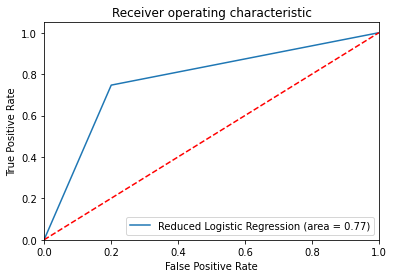

In [32]:
#ROC Curve for the model
log_roc_auc = roc_auc_score(Y_test, Y_pred)
fpr, tpr, thresholds = roc_curve(Y_test, Y_pred)
plt.figure()
plt.plot(fpr, tpr, label='Reduced Logistic Regression (area = %0.2f)' % log_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [33]:
# the same model with the same data with Cross Validation giving almost the same accuracy.
kfold = KFold(n_splits=5, random_state=0) 
score_cv = cross_val_score(logregmodel, x, y, cv=kfold, scoring='accuracy').mean()
score_cv

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning:

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.



0.9142153682205254

In [34]:
#comparing the actual values vs the predicted ones in a table
df = pd.DataFrame({'Actual':Y_test, 'Predicted': Y_pred})
df

,Actual,Predicted
169457,0,0
55555,0,0
137104,0,0
9015,1,1
57832,0,0
...,...,...
39468,1,0
64914,0,0
100476,0,0
138794,1,1


In [35]:
#Dimension reduction with PCA 
from sys import stdout
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import model_selection
from sklearn.preprocessing import scale 

Dimensional Reduction PCA

In [36]:
from sklearn.decomposition import PCA

#PCA
pca2 = PCA()

# Scale the data
X_reduced_train = pca2.fit_transform(scale(X_train))
n = len(X_reduced_train)

# 10-fold CV, with shuffle
kf_10 = model_selection.KFold( n_splits=10, shuffle=True, random_state=1)
regr = logregmodel
accuracy_pca = []

# Calculate Misclass with only the intercept (no principal components in regression)
score = model_selection.cross_val_score(regr, np.ones((n,1)), Y_train.ravel(), cv=kf_10, scoring='accuracy').mean()    
accuracy_pca.append(score)

# Calculate accuracy using CV for the principle components, adding one component at the time.
for i in np.arange(1, 201): #change the number 10 to however many components to analyze. if you want to do it for all 200 components --->np.arange(1, 201)
    score = model_selection.cross_val_score(regr, X_reduced_train[:,:i], Y_train.ravel(), cv=kf_10, scoring='accuracy').mean()
    print(i)
    
    accuracy_pca.append(score)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200


(-1.0, 210.0)

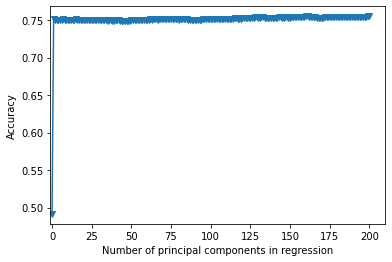

In [37]:
plt.plot(np.array(accuracy_pca), '-v')
plt.xlabel('Number of principal components in regression')
plt.ylabel('Accuracy')
plt.title('')
plt.xlim(xmin=-1)

In [38]:
print(score)
print(accuracy_pca)
print(max(accuracy_pca))
print(accuracy_pca[2])

0.7550449948290442
[0.49164605798301303, 0.7508307410246007, 0.7503872000743197, 0.7505350333960406, 0.7504241686510295, 0.7503873366913807, 0.7503872683828503, 0.7507200265583567, 0.750239530693072, 0.750535224659926, 0.750498228759804, 0.7506831126284712, 0.750683208260414, 0.7504614104618612, 0.7506461713751736, 0.7507940320203068, 0.7502395443547781, 0.750239544354778, 0.7502764172995453, 0.750165675509889, 0.7505351700131015, 0.7500545921775803, 0.750387241059438, 0.7499437274325692, 0.7505721659132236, 0.7500177328945193, 0.7502025621163623, 0.7499067451941533, 0.7499807916412217, 0.7495739733569409, 0.7500175006455156, 0.7495739596952345, 0.7498696400003826, 0.7496479241720665, 0.7497588162404897, 0.749241310813377, 0.7495740689888836, 0.7495370321036432, 0.7491674829536062, 0.748908757563462, 0.7493891441350978, 0.7494631222736358, 0.7494261946820443, 0.749130446068366, 0.7491673873216635, 0.7492413381367893, 0.7492413654602015, 0.7487978518333327, 0.7486869734266154, 0.7492413

In [39]:
X_reduced_test = pca2.transform(scale(X_test))[:,:3]

# Train regression model on training data 
regr = logregmodel
regr.fit(X_reduced_train[:,:3], Y_train)

# Prediction with test data
pred = pd.DataFrame(regr.predict(X_reduced_test))
mean_squared_error(Y_test, pred)
#print(pred)

#--,R^2,ROC,ACCURACY,MATRIX,SENSITIVITY, Specificity
print('--------Accuracy--------')
print(accuracy_score(Y_test, pred))
print('--------rsquared--------')
print(r2_score(Y_test, pred))
print('--------Confusion Matrix--------')
reduced_confu_matrix = confusion_matrix(Y_test, pred)
print(reduced_confu_matrix)
reducedlog_misclass = (reduced_confu_matrix[1,0] + reduced_confu_matrix[0,1])/sum(sum(reduced_confu_matrix))
print('--------Misclassification Rate--------')
print(reducedlog_misclass)
print('--------Classification Report--------')
reduced_class_report = classification_report(Y_test, pred, output_dict=True)
print(classification_report(Y_test, pred))
print('--------Sensitivity--------')
reduced_sensitivity = reduced_class_report['0']['precision']
print(reduced_sensitivity)
print('--------Specificity--------')
reduced_specificity = reduced_class_report['1']['precision']
print(reduced_specificity)


--------Accuracy--------
0.5867955985328442
--------rsquared--------
-3.5816569253034594
--------Confusion Matrix--------
[[22342 18134]
 [  454  4055]]
--------Misclassification Rate--------
0.4132044014671557
--------Classification Report--------
              precision    recall  f1-score   support

           0       0.98      0.55      0.71     40476
           1       0.18      0.90      0.30      4509

    accuracy                           0.59     44985
   macro avg       0.58      0.73      0.50     44985
weighted avg       0.90      0.59      0.67     44985

--------Sensitivity--------
0.9800842253026847
--------Specificity--------
0.18274820857181487


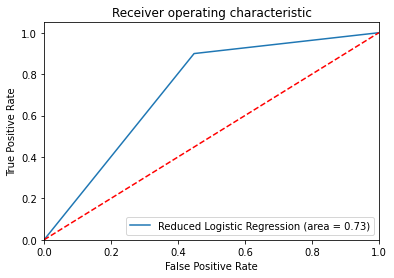

In [40]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
log_reduced_roc_auc = roc_auc_score(Y_test, pred)
fpr, tpr, thresholds = roc_curve(Y_test, pred)
plt.figure()
plt.plot(fpr, tpr, label='Reduced Logistic Regression (area = %0.2f)' % log_reduced_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

Running Test Data

In [41]:
#For test data file
testing_data=pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/testing_data_2_predictor_values.csv')
# check if there are any null values in the data
testing_data.isnull().any().sum()
testing_data=testing_data.drop("Activity",axis=1)
testing_data

x_testing_data=StandardScaler().fit_transform(testing_data)
x_testing_data=pd.DataFrame(x_testing_data)
print(x_testing_data)

x_testing_data

            0         1         2    ...       197       198       199
0     -0.075643 -0.315002 -0.647841  ...  0.031030  0.468476  0.212259
1      0.594247 -0.867998  0.624047  ...  0.069789 -0.404010 -0.817288
2      1.250403  0.369283  1.307834  ... -1.230476 -0.847498  0.170793
3      1.173361  0.033750 -0.836914  ...  0.330168  1.638730 -0.130264
4      1.582869 -0.209244 -1.620231  ... -0.576452  0.549398  1.240442
...         ...       ...       ...  ...       ...       ...       ...
9996   1.181813  0.348917  0.143014  ... -0.309360  0.355614  2.194621
9997   0.803349 -1.494858 -0.116397  ...  1.478321  0.899107 -1.242479
9998  -1.063208 -0.975394  1.111341  ...  0.159591 -0.140223 -0.105420
9999  -0.674342  0.664356  2.038305  ... -0.893902 -0.213594  0.672781
10000 -1.073123 -1.518025  0.707294  ...  2.660986  1.226774 -2.272949

[10001 rows x 200 columns]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199
0,-0.075643,-0.315002,-0.647841,-1.505747,0.945983,-1.148433,1.042547,1.194244,-2.501962,-1.440721,0.491786,-1.131468,-1.065447,2.038979,0.291674,0.118189,1.535487,1.829362,1.329924,0.291691,-0.285415,-0.352551,0.600472,1.153737,-0.903964,1.801825,-1.189577,1.175402,-0.169999,-0.028239,-1.019631,-0.679738,0.948175,1.353838,0.561093,1.230676,0.173372,1.315452,0.556715,-0.578542,...,-1.622259,-0.538304,-0.275786,-0.916135,-0.492850,-0.841853,0.430817,0.875132,-0.627129,-0.408958,-0.538075,-0.513054,1.480515,0.700166,-0.574000,-0.628955,-0.774594,1.563730,-2.423024,-0.080534,0.908077,0.307835,1.224811,0.314614,-0.522933,-1.218818,-1.698688,-1.380273,1.253093,0.412003,-1.548246,-0.183905,0.106172,1.467204,1.919815,0.961521,0.567045,0.031030,0.468476,0.212259
1,0.594247,-0.867998,0.624047,-0.349909,-1.696628,0.918616,0.020464,2.320404,0.040468,-0.795728,-1.685396,-0.458801,-0.522625,-0.427747,-0.503881,0.028243,-1.301323,-0.304659,-1.491050,1.011485,0.016607,-0.792247,-1.170440,1.638261,-0.104336,0.075938,1.012918,0.529343,-0.740845,0.182601,-0.513585,0.356179,0.119232,1.665065,1.171611,0.848705,-1.310919,0.696592,-0.770140,1.508371,...,1.321861,-1.174750,-1.242578,1.324864,1.383843,0.169601,-0.424047,-0.776135,-1.460392,0.034488,-1.734410,-0.983288,0.556419,1.615017,0.655114,2.341933,0.018861,0.211552,1.381960,-2.314113,0.549151,-0.405930,2.300560,-0.272322,0.842936,-2.345025,0.403451,-1.172208,0.717369,1.110518,-1.465814,-0.502284,-0.628923,-0.721131,0.508080,1.966445,0.831964,0.069789,-0.404010,-0.817288
2,1.250403,0.369283,1.307834,1.191557,0.850004,1.609792,0.183987,0.149606,-0.075821,-1.083515,0.299345,0.403509,0.848370,-1.016900,0.406626,-1.225241,-0.762706,-0.888357,0.711795,0.161835,-1.313284,-0.304735,1.607884,1.552166,-0.592922,-0.934823,-0.054777,-2.119374,0.055386,0.309053,-0.840189,-0.362121,-0.724181,-0.494060,0.237535,0.319050,2.105750,0.249804,1.138739,-0.262241,...,0.471670,1.486563,0.408835,0.259537,-1.012333,-0.513051,0.314880,-0.206453,-0.432719,-0.255874,0.603783,-0.008298,-1.070087,-1.063064,1.847924,-0.884678,-0.646223,0.076900,-0.088132,1.127036,-0.095539,1.280175,-0.202672,0.455298,0.729407,-1.591940,-1.569063,-1.076716,0.037208,1.087433,-0.661125,-0.387053,-1.144140,1.303900,0.103914,-0.580896,0.154399,-1.230476,-0.847498,0.170793
3,1.173361,0.033750,-0.836914,-0.045164,-0.745535,0.890055,-0.425242,0.653800,1.331669,-0.513205,0.918708,-0.174345,1.073478,-1.376073,1.113786,-0.409923,0.385008,0.597955,-1.526006,0.752030,-0.297359,-0.784148,0.998823,0.819937,-1.196812,0.634769,-0.277182,-0.576311,-0.551376,-0.498604,-0.191366,-0.633073,0.348574,-0.830513,0.932262,-0.819553,-0.408810,-1.026026,1.211624,1.596766,...,0.829860,-0.092723,-1.844720,2.304091,-1.623817,-1.569604,-0.481224,0.167876,1.676590,-0.391599,-1.471584,-0.693018,0.013254,1.611667,0.460622,0.391323,-0.063475,0.105909,0.358812,0.914862,1.443315,0.581936,0.557461,-0.862839,-0.051027,1.686605,0.651704,0.965991,-0.467855,0.348608,-0.876655,0.291772,-0.267379,0.837931,0.112189,-1.444366,0.115090,0.330168,1.638730,-0.130264
4,1.582869,-0.209244,-1.620231,-0.813288,-0.469052,-2.031087,0.971205,-0.148078,-0.796163,-0.296639,-0.295186,-0.984468,-0.418860,-0.993579,-1.227734,-0.008684,1.083242,1.297477,0.910708,-1.171788,0.631413,-0.728645,0.624923,-0.517356,-2.415731,-1.166133,-0.468696,-0.928332,-1.119163,-0.521391,0.271463,-1.070025,-1.060506,1.364217,0.406926,-0.008198,0.230187,0.506951,0.761200,0.100119,...,1.956649,-2.799331,-0.362948,1.214217,0.224871,0.823051,-0.551585,-2.058142,-0.560937,0.232186,-1.022689,-1.686792,-1.397181,0.595166,0.565761,1.409594,-1.304769,-0.959706,0.479652,-0.609791,1.262143,-1.294294,-0.609602,2.341900,0.838782,-0.857219,-0.479631,0.808710,1.230538,

In [42]:
# Deliverable I prediction
# Uncomment to output prediction
#prediction from test data
#X_reduced_testing = pca2.transform(scale(x_testing_data))[:,:3]
#Y_testing_pred = regr.predict(X_reduced_testing)

#import numpy as np 
#np.savetxt("predictions.csv", Y_testing_pred)
#files.download('predictions.csv')

Deliverable II

In [43]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification

Adaboost classifier

In [44]:
#Running the Adaboost classifier with 100 estimators
model_AB= AdaBoostClassifier(n_estimators=100,learning_rate=1)
model_AB.fit(X_train, Y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1,
                   n_estimators=100, random_state=None)

In [45]:
#predicting the y_hat values
y_pred = model_AB.predict(X_test)

In [46]:
#calculating the accuracy of this model
accuracy_score(Y_test, Y_pred)

0.7941536067578081

In [47]:
#Using KFold cross validation to test our adaboost model
kfold=KFold(n_splits=10,random_state=0,shuffle=True)

In [48]:
score_cv=cross_val_score(model_AB,X_train,Y_train,cv=kfold,scoring='accuracy').mean()

In [49]:
score_cv.mean()
score_cv

0.8376948466678416

In [50]:
#making the confusion matrix
ConfusionMatrix_AM=confusion_matrix(Y_test,y_pred)
print(ConfusionMatrix_AM)

[[26813 13663]
 [  793  3716]]


In [51]:
misclass_Ab= (ConfusionMatrix_AM[1,0] + ConfusionMatrix_AM[0,1])/sum(sum(ConfusionMatrix_AM))

print('--------Misclassification Rate--------')

print(misclass_Ab)

--------Misclassification Rate--------
0.321351561631655


In [52]:
#printing the classification report
print(classification_report(Y_test,y_pred))

              precision    recall  f1-score   support

           0       0.97      0.66      0.79     40476
           1       0.21      0.82      0.34      4509

    accuracy                           0.68     44985
   macro avg       0.59      0.74      0.56     44985
weighted avg       0.90      0.68      0.74     44985



In [53]:
#sensitivity of the model
sensitivity1 = ConfusionMatrix_AM[0,0]/(ConfusionMatrix_AM[0,0]+ConfusionMatrix_AM[1,0])
print('Sensitivity : ', sensitivity1 )

Sensitivity :  0.9712743606462363


In [54]:
#specificity of the model
specificity1 = ConfusionMatrix_AM[1,1]/(ConfusionMatrix_AM[0,1]+ConfusionMatrix_AM[1,1])
print('Specificity : ', specificity1)

Specificity :  0.21382127855457736


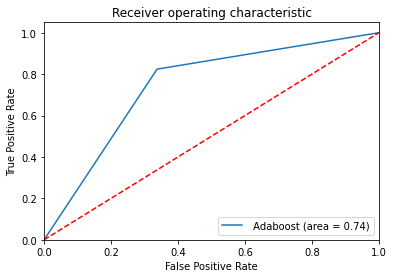

In [55]:
#Here is the ROC curve. 
AB_roc_auc = roc_auc_score(Y_test, y_pred)
fpr, tpr, thresholds = roc_curve(Y_test, y_pred)
plt.figure()
plt.plot(fpr, tpr, label=' Adaboost (area = %0.2f)' % AB_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('AB_ROC')
plt.show()

LSVC model

In [56]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn import svm
from sklearn.svm import LinearSVC
from sklearn.datasets import make_classification
from sklearn.model_selection import GridSearchCV

In [57]:
#making the LSVC model
model_LSVC = GridSearchCV(LinearSVC(random_state=0, tol=1e-5, max_iter=1000), param_grid= {'C': [0.1, 1.0, 10, 100]})

In [58]:
#fitting the model
model_LSVC.fit(X_train, Y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Li

GridSearchCV(cv=None, error_score=nan,
             estimator=LinearSVC(C=1.0, class_weight=None, dual=True,
                                 fit_intercept=True, intercept_scaling=1,
                                 loss='squared_hinge', max_iter=1000,
                                 multi_class='ovr', penalty='l2',
                                 random_state=0, tol=1e-05, verbose=0),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1.0, 10, 100]}, pre_dispatch='2*n_jobs',
             refit=True, return_train_score=False, scoring=None, verbose=0)

In [59]:
#printing the best parameters values
print(model_LSVC.best_params_)

{'C': 0.1}


In [60]:
#calculating the y_hat values of the model
y_hat_LSVC = model_LSVC.best_estimator_.predict(X_test)

In [61]:
#confusion matrix
confu_matrix_LSVC = confusion_matrix(Y_test, y_hat_LSVC)
print('--------Confusion Matrix--------')
print(confu_matrix_LSVC)

--------Confusion Matrix--------
[[32411  8065]
 [ 1143  3366]]


In [62]:
#Classification Report, Sensitivity, Specificity, Misclassification Rate
print('--------Classification Report--------')
class_report_LSVC = classification_report(Y_test, y_hat_LSVC, output_dict=True)
print(classification_report(Y_test, y_hat_LSVC))

print('--------Sensitivity--------')
sensitivity_LSVC = class_report_LSVC['0']['precision']
print(sensitivity_LSVC)

print('--------Specificity--------')
specificity_LSVC = class_report_LSVC['1']['precision']
print(specificity_LSVC)

misclass_LSVC = (confu_matrix_LSVC[1,0] + confu_matrix_LSVC[0,1])/sum(sum(confu_matrix_LSVC))
print('--------Misclassification Rate--------')
print(misclass_LSVC)

--------Classification Report--------
              precision    recall  f1-score   support

           0       0.97      0.80      0.88     40476
           1       0.29      0.75      0.42      4509

    accuracy                           0.80     44985
   macro avg       0.63      0.77      0.65     44985
weighted avg       0.90      0.80      0.83     44985

--------Sensitivity--------
0.9659355069440305
--------Specificity--------
0.29446242673431894
--------Misclassification Rate--------
0.20469045237301323


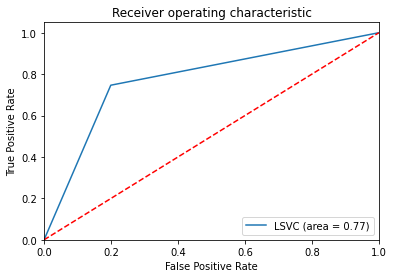

In [63]:
#ROC Curve for the model
roc_auc_LSVC = roc_auc_score(Y_test, y_hat_LSVC)
fpr, tpr, thresholds = roc_curve(Y_test, y_hat_LSVC)
plt.figure()
plt.plot(fpr, tpr, label='LSVC (area = %0.2f)' % roc_auc_LSVC)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('LSVC_ROC')
plt.show()

In [64]:
# Deliverable II prediction
# Uncomment to output prediction
#prediction from test data based on the PCA model because has the less missclassification error.

#X_reduced_testing = pca2.transform(scale(x_testing_data))[:,:3]
#Y_testing_pred = regr.predict(X_reduced_testing)

#import numpy as np 
#np.savetxt("predictions2.csv", Y_testing_pred)
#files.download('predictions2.csv')

Deliverable III

In [65]:
from sklearn.neural_network import MLPClassifier 

In [66]:
model=MLPClassifier()
model.fit(X_train,Y_train)
y_hat_mlp=model.predict(X_test)
from sklearn.metrics import confusion_matrix,accuracy_score
confusion_matrix(Y_test,y_hat_mlp)
accuracy_score(Y_test,y_hat_mlp)

0.6905190619095254

In [67]:
#confusion matrix
confu_matrix_NN = confusion_matrix(Y_test, y_hat_mlp)
print('--------Confusion Matrix--------')
print(confu_matrix_NN)

--------Confusion Matrix--------
[[27896 12580]
 [ 1342  3167]]


In [68]:
#Classification Report, Sensitivity, Specificity, Misclassification Rate
print('--------Classification Report--------')
class_report = classification_report(Y_test, y_hat_mlp, output_dict=True)
print(classification_report(Y_test, y_hat_mlp))

print('--------Sensitivity--------')
sensitivity = class_report['0']['precision']
print(sensitivity)

print('--------Specificity--------')
specificity = class_report['1']['precision']
print(specificity)

misclass = (confu_matrix_NN[1,0] + confu_matrix_NN[0,1])/sum(sum(confu_matrix_NN))
print('--------Misclassification Rate--------')
print(misclass)

--------Classification Report--------
              precision    recall  f1-score   support

           0       0.95      0.69      0.80     40476
           1       0.20      0.70      0.31      4509

    accuracy                           0.69     44985
   macro avg       0.58      0.70      0.56     44985
weighted avg       0.88      0.69      0.75     44985

--------Sensitivity--------
0.9541008276899925
--------Specificity--------
0.2011176732075951
--------Misclassification Rate--------
0.3094809380904746


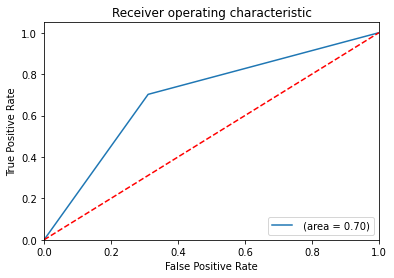

In [69]:
#ROC Curve for the model
roc_auc = roc_auc_score(Y_test, y_hat_mlp)
fpr, tpr, thresholds = roc_curve(Y_test, y_hat_mlp)
plt.figure()
plt.plot(fpr, tpr, label=' (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('ROC')
plt.show()

In [80]:
#For test data file
imb_testing_data=pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/imbalanced_testing_data_2_predictor_values.csv')
# check if there are any null values in the data
imb_testing_data.isnull().any().sum()
imb_testing_data=imb_testing_data.drop("Activity",axis=1)
imb_testing_data

x_imb_testing_data=StandardScaler().fit_transform(imb_testing_data)
x_imb_testing_data=pd.DataFrame(x_imb_testing_data)
print(x_imb_testing_data)

x_imb_testing_data

           0         1         2    ...       197       198       199
0     0.535098  0.788477 -0.319791  ... -0.381954  1.148123 -1.091663
1    -0.531585  0.520485  0.094325  ... -1.206112 -1.015172 -0.381096
2    -0.406922  0.601596  1.080469  ...  0.595228  1.849311 -0.311270
3    -1.371259  0.149165  0.799891  ... -0.081310 -0.777071  0.224711
4    -0.697593 -0.888247  0.333350  ...  0.508625 -0.964457 -0.351333
...        ...       ...       ...  ...       ...       ...       ...
1487 -0.718031  0.697631 -1.155592  ...  2.096273 -2.122893  0.684934
1488 -0.828756  0.821713 -0.147037  ...  1.465626  0.340589  0.203856
1489  0.195799  0.984790  0.930143  ...  0.760229 -0.667241 -0.506374
1490 -0.468784  0.611795 -0.934778  ...  0.554390  1.335407 -0.311017
1491 -0.983958 -1.514132 -0.594877  ... -0.483261  0.637600  0.185914

[1492 rows x 200 columns]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199
0,0.535098,0.788477,-0.319791,-0.119719,0.779017,-0.963635,0.564513,1.563247,0.672038,0.665196,2.232506,-0.251996,-1.025818,-0.438720,-0.967081,-1.125429,0.427523,0.818296,1.324337,0.776936,1.012671,0.657724,0.456857,0.512439,1.046879,-1.514961,-2.429819,0.347267,0.546871,1.804003,1.008002,0.814873,-1.297689,-1.134186,0.573209,2.308655,-0.958537,-0.831607,0.148809,0.141610,...,-0.289549,-0.813310,-0.646908,-0.192169,-1.125058,-0.473973,0.889003,-0.501427,-0.628838,-0.465595,0.134930,0.488918,-1.285754,0.745800,1.717563,1.000198,-1.182818,-0.354943,1.032359,-0.208016,0.925798,1.183013,0.885516,-0.190550,1.260479,0.648004,-0.035026,0.455962,-0.537790,1.382700,0.244979,-0.205274,0.385036,-0.036677,-1.285731,1.179805,0.534882,-0.381954,1.148123,-1.091663
1,-0.531585,0.520485,0.094325,-0.430865,-1.403158,-1.362429,-0.925973,-0.302469,0.642642,-1.344188,-0.946466,-1.631373,1.920080,-0.618903,1.669912,0.658609,-0.527779,0.588594,-0.216944,-1.085891,-0.534208,-0.523704,-0.160484,1.530046,-2.153830,0.583339,0.194080,-0.629395,0.054931,-0.625266,0.386486,0.635424,-0.393382,-0.577725,0.816570,-1.459801,-0.669813,0.282032,0.845533,1.052135,...,0.870988,-0.744602,-0.082084,-1.447254,0.832692,0.252385,-0.628158,-0.121849,-0.092223,1.309929,-0.613026,2.147576,0.136328,-0.980309,1.182893,-0.175009,-0.522564,1.485385,-1.619275,0.083402,0.943544,0.941250,-0.864016,-0.117889,0.542071,-1.348491,-1.226788,0.790944,0.290815,-0.810481,-0.541099,-1.203719,-0.492008,0.032932,-0.718522,-0.139212,0.363743,-1.206112,-1.015172,-0.381096
2,-0.406922,0.601596,1.080469,-0.186393,1.930501,0.376867,-0.274976,-0.446564,-1.451764,0.650779,-1.235208,-0.110684,-1.742515,0.352041,-0.467699,-0.295893,0.990245,0.801366,0.355579,-0.560408,-0.904922,0.796375,0.235239,-0.985441,-1.506640,1.127262,0.283771,2.047126,1.065967,1.158218,-1.087838,-0.213952,-0.403873,0.049027,-1.175946,-1.981015,0.909169,0.024960,0.416923,-0.203274,...,-0.998442,0.037603,0.940976,0.564259,0.753572,-0.628239,-0.231109,1.278725,0.286553,-0.544271,0.949804,0.023518,0.202007,0.154726,-2.350318,0.721255,0.607824,-0.415402,0.034556,0.347172,0.648931,-0.555494,0.474844,-1.323766,0.798722,-0.040829,0.909706,0.059079,-0.761505,0.134532,-0.525474,-0.773114,-0.365550,0.798771,1.701203,0.167283,-1.763881,0.595228,1.849311,-0.311270
3,-1.371259,0.149165,0.799891,-0.768187,0.410408,0.533841,-0.545114,-1.464391,-0.084144,-1.453358,-1.173998,-0.357926,0.501056,0.946314,1.709105,-0.037967,0.028319,-1.520507,0.367552,-1.480097,0.068721,1.016771,-0.580963,0.121393,0.069915,-0.533211,-0.358354,1.853226,0.934601,0.319415,-0.145689,0.327728,0.940924,-0.501135,-0.047490,-1.657868,1.254639,-1.627687,-0.004479,0.715487,...,-0.792643,-0.087184,-0.032991,-0.418736,-0.361459,-0.515961,0.901867,0.273485,0.282621,-0.617068,0.109895,0.025617,-0.208912,-1.354379,-1.592380,-0.242033,-0.128584,0.707347,0.863869,-0.887019,0.843660,-0.531560,0.480573,-1.180655,0.477601,-1.901353,0.784019,-0.529956,-0.284862,0.409675,0.218866,-0.525918,-1.035120,0.212379,0.409245,-1.128529,-0.521269,-0.081310,-0.777071,0.224711
4,-0.697593,-0.888247,0.333350,0.442814,-1.044208,-1.892310,-0.619251,0.421647,1.154287,-0.095761,-1.050740,-0.744999,1.392337,-0.510586,-1.609170,-0.507653,2.432612,0.417737,-0.117510,-1.958925,2.389266,-0.512826,1.249303,-0.105217,-0.607288,0.586609,0.856828,0.826843,-0.662838,1.602357,-0.979340,0.904639,-0.708321,0.188607,-1.172063,0.351164,-1.361196,-1.133266,-0.704741,-0.487292,...,-0.311296,0.223027,-0.318647,-0.225768,-1.834859,-1.747757,-1.469671,0.018810,-0.278004,-0.438524,0.748781,0.248145,-0.594870,0.673443,0.625229,1.840129,0.348121,-1.869236,-2.367680,0.592338,0.365445,1.270928,-0.937968,0.599409,-0.401203,0.583362,0.758906,0.844751,-0.08

In [81]:
# Deliverable III prediction

#prediction from test data

Y_imb_pred =  model_LSVC.best_estimator_.predict(x_imb_testing_data)

import numpy as np 
np.savetxt("imb_predictions.csv", Y_imb_pred)
files.download('imb_predictions.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>